# Compare GT and Rendered Image patchwise and compare frequency domain

In [6]:
import os
import numpy as np
import cv2
from glob import glob
from numpy.fft import fft2, fftshift
import matplotlib.pyplot as plt

import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode(connected=True)

In [3]:
# load scene, dataset

from glob import glob
import math
import torch
from scene import Scene
import os
import sys
import numpy as np
from tqdm import tqdm
from os import makedirs
from gaussian_renderer import render
import torchvision
from argparse import ArgumentParser, Namespace
from plyfile import PlyData, PlyElement

from utils.general_utils import safe_state
from utils.graphics_utils import getWorld2View2, getWorld2View, getProjectionMatrix
from arguments import ModelParams, PipelineParams, OptimizationParams, get_combined_args
from gaussian_renderer import GaussianModel

# Set up command line argument parser
parser = ArgumentParser(description="Testing script parameters")
model = ModelParams(parser, sentinel=True)
op = OptimizationParams(parser)
pipeline = PipelineParams(parser)
parser.add_argument("--iteration", default=-1, type=int)
parser.add_argument("--skip_train", action="store_true")
parser.add_argument("--skip_test", action="store_true")
parser.add_argument("--quiet", action="store_true")

args_cmdline = parser.parse_args(args=[
    "--model_path",
    #"/home/hjp/gaussian_models/bonsai",
    #"/home/hjp/gaussian-splatting/output/45f70d99-a",
    #"/home/hjp/gaussian-splatting/output/89274efe-d",
    #"/home/hjp/gaussian-splatting/output/e4d1418e-9",
    "/home/youngdong/gaussian_models/flowers",
    
    "--source_path",
    #"/home/hjp/dataset/mipnerf360/bonsai"
    #"/home/hjp/dataset/mipnerf360/garden",
    #"/home/hjp/dataset/tandt/train",
    "/home/hjp/dataset/flowers",
])

cfgfile_string = "Namespace()"
try:
    cfgfilepath = os.path.join(args_cmdline.model_path, "cfg_args")
    print("Looking for config file in", cfgfilepath)
    with open(cfgfilepath) as cfg_file:
        print("Config file found: {}".format(cfgfilepath))
        cfgfile_string = cfg_file.read()
except TypeError:
    print("Config file not found at")
    pass
print("Config file arguments: ", cfgfile_string)

args_cfgfile = eval(cfgfile_string)

merged_dict = vars(args_cfgfile).copy()
for k,v in vars(args_cmdline).items():
    if v != None:
        merged_dict[k] = v
args = Namespace(**merged_dict)

assert os.path.exists(args.model_path), "Model path does not exist"
assert os.path.exists(args.source_path), "Source path does not exist"

model_args = model.extract(args)
optim_args = op.extract(args)
pipe_args = pipeline.extract(args)

print(model_args.resolution)

Looking for config file in /home/youngdong/gaussian_models/flowers/cfg_args
Config file found: /home/youngdong/gaussian_models/flowers/cfg_args
Config file arguments:  Namespace(data_device='cuda', eval=True, images='images', model_path='/home/jang/models/flowers/', resolution=-1, sh_degree=3, source_path='/home/jang/dataset/flowers', white_background=False)
-1


In [4]:
model_args.data_device = "cuda"
gaussians = GaussianModel(model_args.sh_degree)
scene = Scene(
    model_args, gaussians, 
    load_iteration = args.iteration, shuffle = False
)

Loading trained model at iteration 30000
Reading camera 173/173
Loading Training Cameras
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1
Loading Test Cameras


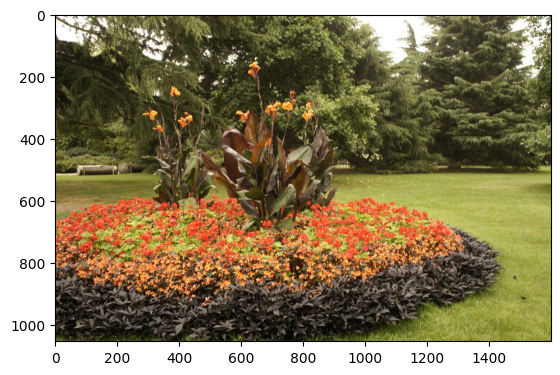

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


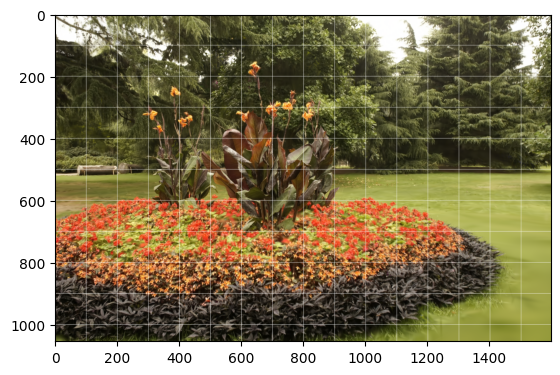

In [5]:
CAMERA_IDX = 10
CAMERA_IDX = 100

train_camera_list = scene.getTrainCameras()

bg_color = [1, 1, 1] if model_args.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device="cuda")

image_gt_torch  = train_camera_list[CAMERA_IDX].original_image.detach().cpu()
image_gt_np     = (image_gt_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
render_pkg  = render(
    train_camera_list[CAMERA_IDX], gaussians, pipe_args,
    bg_color = torch.rand((3), device="cuda") if optim_args.random_background else background
)
image_rendered_torch = render_pkg["render"].detach().cpu()
#image_rendered_np = (image_rendered_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
image_rendered_np = image_rendered_torch.clamp(0, 1).permute(1,2,0).numpy()

plt.imshow(image_gt_np)
plt.show()

patch_size = 100

image_rendered_np[::patch_size, :, :] = np.array([255, 255, 255], dtype=np.uint8)
image_rendered_np[:, ::patch_size, :] = np.array([255, 255, 255], dtype=np.uint8)

plt.imshow(image_rendered_np)
plt.show()

In [48]:
train_camera_list = scene.getTrainCameras()

camera_position_array = np.array(list(map(
    lambda cam: np.linalg.inv(getWorld2View2(cam.R, cam.T))[:3, 3:4].copy(),
    train_camera_list
))).reshape(-1, 3)
camera_facing_v_array = np.array(list(map(lambda x: x.R @ np.array([0,0,1]), train_camera_list)))


camera = train_camera_list[CAMERA_IDX]
cam_center = np.linalg.inv(
    getWorld2View2(camera.R, camera.T)
)[:3, 3:4].copy().reshape(-1)
cam_basis_x = camera.R @ np.array([1,0,0])
cam_basis_y = camera.R @ np.array([0,1,0])
cam_basis_z = camera.R @ np.array([0,0,1])

xyz = gaussians._xyz.detach().cpu().numpy()

point_displacement_cam_basis_x_component = np.dot(xyz - cam_center, cam_basis_x).reshape(-1, 1) * cam_basis_x.reshape(1, 3)
point_displacement_cam_basis_y_component = np.dot(xyz - cam_center, cam_basis_y).reshape(-1, 1) * cam_basis_y.reshape(1, 3)
point_displacement_cam_basis_z_component = np.dot(xyz - cam_center, cam_basis_z).reshape(-1, 1) * cam_basis_z.reshape(1, 3)

point_displacement_cam_xz_proj = point_displacement_cam_basis_x_component + point_displacement_cam_basis_z_component
point_displacement_cam_yz_proj = point_displacement_cam_basis_y_component + point_displacement_cam_basis_z_component

x_dir_angle_arr = np.arccos(
    np.dot(point_displacement_cam_xz_proj, cam_basis_z) / (np.linalg.norm(point_displacement_cam_xz_proj, axis=1))
)
y_dir_angle_arr = np.arccos(
    np.dot(point_displacement_cam_yz_proj, cam_basis_z) / (np.linalg.norm(point_displacement_cam_yz_proj, axis=1))
)

x_dir_mask = np.abs(x_dir_angle_arr) < (camera.FoVx / 2)
y_dir_mask = np.abs(y_dir_angle_arr) < (camera.FoVy / 2)
angle_mask = x_dir_mask & y_dir_mask

X_inside, Y_inside, Z_inside = xyz[angle_mask][::100].T
X_outside, Y_outside, Z_outside = xyz[~angle_mask][::1000].T

# camera plot
camera_cone = go.Cone(
    x = camera_position_array[:, 0], y = camera_position_array[:, 1], z = camera_position_array[:, 2],
    u = camera_facing_v_array[:, 0], v = camera_facing_v_array[:, 1], w = camera_facing_v_array[:, 2],
    sizemode="absolute", sizeref=0.5, anchor="tail",
    #marker=dict(size=1, color="black", opacity=0.8)
)
focus_camera_cone = go.Cone(
    x = [camera_position_array[CAMERA_IDX, 0]], y = [camera_position_array[CAMERA_IDX, 1]], z = [camera_position_array[CAMERA_IDX, 2]],
    u = [camera_facing_v_array[CAMERA_IDX, 0]], v = [camera_facing_v_array[CAMERA_IDX, 1]], w = [camera_facing_v_array[CAMERA_IDX, 2]],
    sizemode="absolute", sizeref=0.5, anchor="tail",
    #marker=dict(size=2, color="red", opacity=0.8)
)

# points plot
points_inside_pyramid_angle = go.Scatter3d(
    x=X_inside, y=Y_inside, z=Z_inside,
    mode='markers', marker=dict(size=1, color="blue", opacity=0.8)
)
points_outside_pyramid_angle = go.Scatter3d(
    x=X_outside, y=Y_outside, z=Z_outside,
    mode='markers', marker=dict(size=1, color="red", opacity=0.8)
)
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(
    data=[
        camera_cone, focus_camera_cone,
        points_inside_pyramid_angle, points_outside_pyramid_angle
    ],
    layout=layout
)

fig.update_scenes(aspectmode='data')

pyo.plot(fig)
iplot(fig)

In [52]:
from utils.graphics_utils import getWorld2View2, getWorld2View, getProjectionMatrix


camera  = train_camera_list[CAMERA_IDX]

cam_center = np.linalg.inv(
    getWorld2View2(camera.R, camera.T)
)[:3, 3:4].copy().reshape(-1)

cam_basis_x = camera.R @ np.array([1,0,0])
cam_basis_y = camera.R @ np.array([0,1,0])
cam_basis_z = camera.R @ np.array([0,0,1])

lt_v = cam_basis_z - cam_basis_y * np.tan(camera.FoVy / 2) - cam_basis_x * np.tan(camera.FoVx / 2)
rt_v = cam_basis_z - cam_basis_y * np.tan(camera.FoVy / 2) + cam_basis_x * np.tan(camera.FoVx / 2)
lb_v = cam_basis_z + cam_basis_y * np.tan(camera.FoVy / 2) - cam_basis_x * np.tan(camera.FoVx / 2)
rb_v = cam_basis_z + cam_basis_y * np.tan(camera.FoVy / 2) + cam_basis_x * np.tan(camera.FoVx / 2)


co_x = np.tan(camera.FoVx / 2)
co_y = np.tan(camera.FoVy / 2)
co_x = 1
co_y = 1

lt_v = cam_basis_z + co_x * cam_basis_x - co_y * cam_basis_y
rt_v = cam_basis_z + co_x * cam_basis_x + co_y * cam_basis_y
lb_v = cam_basis_z - co_x * cam_basis_x - co_y * cam_basis_y
rb_v = cam_basis_z - co_x * cam_basis_x + co_y * cam_basis_y


image_height, image_width = image_gt_np.shape[:2]

ridx = 1
cidx = 1

p_lt_v = (patch_size * ridx / image_height) * (
    ((patch_size * cidx) / image_width) * rb_v + (image_width - patch_size * cidx) / image_width * lb_v
) + ((image_height - patch_size * ridx) / image_height) * (
    ((patch_size * cidx) / image_width) * rt_v + (image_width - patch_size * cidx) / image_width * lt_v
)
p_rt_v = (patch_size * ridx / image_height) * (
    ((patch_size * (cidx + 1)) / image_width) * rb_v + (image_width - patch_size * (cidx + 1)) / image_width * lb_v
) + ((image_height - patch_size * ridx) / image_height) * (
    ((patch_size * (cidx + 1)) / image_width) * rt_v + (image_width - patch_size * (cidx + 1)) / image_width * lt_v
)
p_lb_v = (patch_size * (ridx + 1) / image_height) * (
    ((patch_size * cidx) / image_width) * rb_v + (image_width - patch_size * cidx) / image_width * lb_v
) + ((image_height - patch_size * (ridx + 1)) / image_height) * (
    ((patch_size * cidx) / image_width) * rt_v + (image_width - patch_size * cidx) / image_width * lt_v
)
p_rb_v = (patch_size * (ridx + 1) / image_height) * (
    ((patch_size * (cidx + 1)) / image_width) * rb_v + (image_width - patch_size * (cidx + 1)) / image_width * lb_v
) + ((image_height - patch_size * (ridx + 1)) / image_height) * (
    ((patch_size * (cidx + 1)) / image_width) * rt_v + (image_width - patch_size * (cidx + 1)) / image_width * lt_v
)

def filter_points(vector_endpoints, origin, points):
    x, residuals, rank, s = np.linalg.lstsq(
        #np.array([p_lb_v, p_rb_v, p_lt_v, p_rt_v,]).T,
        #np.array([lt_v, rt_v, lb_v, rb_v,]).T,
        (vector_endpoints - origin).T,
        (points - origin).T
        #xyz.detach().cpu().numpy().T
    )

    return np.all(x >= 0, axis=0)


xyz = gaussians.get_xyz.clone().detach().cpu().numpy()
filtered_indices = filter_points(np.array([p_lt_v, p_rt_v, p_lb_v, p_rb_v]), cam_center, xyz)
print(len(filtered_indices), filtered_indices.sum())



#-----------------  Plot 3D Vectors  -----------------#
import plotly.graph_objects as go

# Define vectors as [x, y, z]
vectors = [
    lt_v, rt_v, lb_v, rb_v,
    p_lt_v, p_rt_v, p_lb_v, p_rb_v
]

fig = go.Figure()

# Plot each vector
for vec in vectors:
    fig.add_trace(
        go.Scatter3d(
            x=[0, vec[0]], y=[0, vec[1]], z=[0, vec[2]], 
            mode='lines+markers+text', 
            text=["", f"({vec[0]}, {vec[1]}, {vec[2]})"], 
            textposition="top center",
            marker=dict(size=4),
            line=dict(width=5)
        )
    )

# Set titles and labels
fig.update_layout(
    title='3D Vectors',
    scene=dict(
        xaxis_title='X axis', yaxis_title='Y axis', zaxis_title='Z axis'
    ),
    showlegend=False
)

fig.show()

/tmp/ipykernel_2404039/4063192669.py:58: FutureWarning:

`rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.



3636448 619


In [53]:
cam_basis_x = camera.R @ np.array([1,0,0])
cam_basis_y = camera.R @ np.array([0,1,0])
cam_basis_z = camera.R @ np.array([0,0,1])

lt_cam_basis_x_component = np.dot(lt_v - cam_center, cam_basis_x).reshape(-1, 1) * cam_basis_x.reshape(1, 3)
lt_cam_basis_y_component = np.dot(lt_v - cam_center, cam_basis_y).reshape(-1, 1) * cam_basis_x.reshape(1, 3)
lt_cam_basis_z_component = np.dot(lt_v - cam_center, cam_basis_z).reshape(-1, 1) * cam_basis_x.reshape(1, 3)

lt_cam_xz_proj = lt_cam_basis_x_component + lt_cam_basis_z_component
lt_cam_yz_proj = lt_cam_basis_y_component + lt_cam_basis_z_component

x_angle = np.arccos(
    np.dot(lt_cam_xz_proj, cam_basis_z) / (np.linalg.norm(lt_cam_xz_proj, axis=1))
)
y_angle = np.arccos(
    np.dot(lt_cam_yz_proj, cam_basis_z) / (np.linalg.norm(lt_cam_yz_proj, axis=1))
)

x_angle, camera.FoVx / 2

(array([1.57079633]), 0.525915177264699)

In [54]:
camera_position_array = np.array(list(map(
    lambda cam: np.linalg.inv(getWorld2View2(cam.R, cam.T))[:3, 3:4].copy(),
    train_camera_list
))).reshape(-1, 3)
camera_facing_v_array = np.array(list(map(lambda x: x.R @ np.array([0,0,1]), train_camera_list)))

patch_pyramid_mask = filter_points(np.array([p_lt_v, p_rt_v, p_lb_v, p_rb_v]), cam_center, xyz)
camera_pyramid_mask = filter_points(np.array([lt_v, rt_v, lb_v, rb_v]), cam_center, xyz)
print(camera_pyramid_mask.sum(), patch_pyramid_mask.sum())

X_outside, Y_outside, Z_outside = xyz[~camera_pyramid_mask][::1000].T
X_camera_pyramid, Y_camera_pyramid, Z_camera_pyramid = xyz[camera_pyramid_mask & ~patch_pyramid_mask][::10].T
X_patch_pyramid, Y_patch_pyramid, Z_patch_pyramid = xyz[patch_pyramid_mask][::10].T

# camera plot
camera_cone = go.Cone(
    x = camera_position_array[:, 0], y = camera_position_array[:, 1], z = camera_position_array[:, 2],
    u = camera_facing_v_array[:, 0], v = camera_facing_v_array[:, 1], w = camera_facing_v_array[:, 2],
    sizemode="absolute", sizeref=0.5, anchor="tail",
    #marker=dict(size=1, color="black", opacity=0.8)
)
focus_camera_cone = go.Cone(
    x = [camera_position_array[CAMERA_IDX, 0]], y = [camera_position_array[CAMERA_IDX, 1]], z = [camera_position_array[CAMERA_IDX, 2]],
    u = [camera_facing_v_array[CAMERA_IDX, 0]], v = [camera_facing_v_array[CAMERA_IDX, 1]], w = [camera_facing_v_array[CAMERA_IDX, 2]],
    sizemode="absolute", sizeref=0.5, anchor="tail",
    #marker=dict(size=2, color="red", opacity=0.8)
)

# vector plot
cam_corner_vector_list = list(map(
    lambda vec : go.Scatter3d(
        x=[cam_center[0], vec[0]], y=[cam_center[1], vec[1]], z=[cam_center[2], vec[2]],
        mode='lines', line=dict(color="blue", width=2)
    ),
    [lt_v, rt_v, lb_v, rb_v]
))
patch_corner_vector_list = list(map(
    lambda vec : go.Scatter3d(
        x=[cam_center[0], vec[0]], y=[cam_center[1], vec[1]], z=[cam_center[2], vec[2]],
        mode='lines', line=dict(color="red", width=2)
    ),
    [p_lt_v, p_rt_v, p_lb_v, p_rb_v]
))

# point plot
points_outside_pyramid = go.Scatter3d(
    x=X_outside, y=Y_outside, z=Z_outside,
    mode='markers', marker=dict(size=1, color="yellow", opacity=0.8)
)
points_camera_pyramid = go.Scatter3d(
    x=X_camera_pyramid, y=Y_camera_pyramid, z=Z_camera_pyramid,
    mode='markers', marker=dict(size=1, color="blue", opacity=0.8)
)
points_patch_pyramid = go.Scatter3d(
    x=X_patch_pyramid, y=Y_patch_pyramid, z=Z_patch_pyramid,
    mode='markers', marker=dict(size=1, color="red", opacity=0.8)
)

layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(
    data=[
        camera_cone, focus_camera_cone,
        *cam_corner_vector_list, *patch_corner_vector_list,
        #points_outside_pyramid,
        points_camera_pyramid, points_patch_pyramid
    ],
    layout=layout
)
fig.update_scenes(aspectmode='data')

pyo.plot(fig)
iplot(fig)


/tmp/ipykernel_2404039/4063192669.py:58: FutureWarning:

`rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.



230935 619


In [24]:


gaussians_new = GaussianModel(model_args.sh_degree)
gaussians_new._xyz          = gaussians._xyz.detach().clone()[~filtered_indices]
gaussians_new._scaling      = gaussians._scaling.detach().clone()[~filtered_indices]
gaussians_new._rotation     = gaussians._rotation.detach().clone()[~filtered_indices]
gaussians_new._opacity      = gaussians._opacity.detach().clone()[~filtered_indices]
gaussians_new._features_dc  = gaussians._features_dc.detach().clone()[~filtered_indices]
gaussians_new._features_rest = gaussians._features_rest.detach().clone()[~filtered_indices]



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


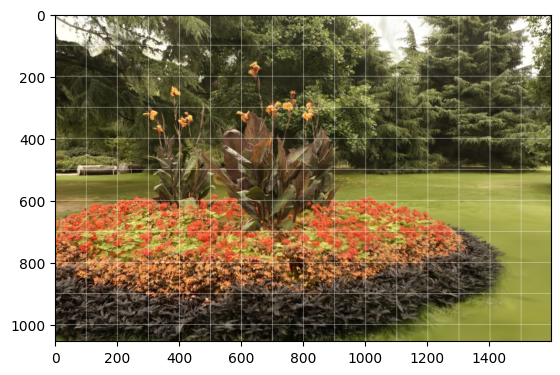

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


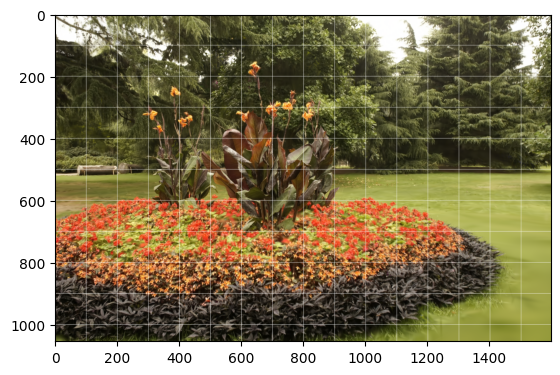

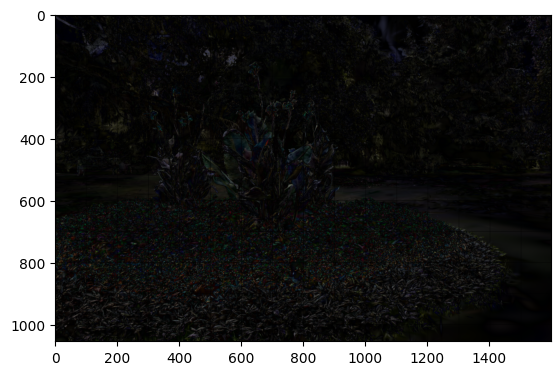

In [25]:
render_pkg_new = render(
    train_camera_list[CAMERA_IDX], gaussians_new, pipe_args,
    bg_color = torch.rand((3), device="cuda") if optim_args.random_background else background
)
image_new_rendered_torch = render_pkg_new["render"].detach().cpu()
#image_rendered_np = (image_rendered_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
image_new_rendered_np = image_new_rendered_torch.clamp(0, 1).permute(1,2,0).numpy()

image_new_rendered_np[::patch_size, :, :] = np.array([255, 255, 255], dtype=np.uint8)
image_new_rendered_np[:, ::patch_size, :] = np.array([255, 255, 255], dtype=np.uint8)
plt.imshow(image_new_rendered_np)
plt.show()

plt.imshow(image_rendered_np)
plt.show()

plt.imshow(np.abs(image_rendered_np - image_new_rendered_np))

In [22]:
xyz = gaussians.get_xyz[::1,:].detach().cpu().numpy()

def filter_points(vector_endpoints, origin, points):
    x, residuals, rank, s = np.linalg.lstsq(
        (vectors - origin).T,
        (points - origin).T
        #xyz.detach().cpu().numpy().T
    )

    return np.all(x >= 0, axis=0)

vectors = np.array([p_lt_v, p_rt_v, p_lb_v, p_rb_v])
#vectors = np.array([lt_v, rt_v, lb_v, rb_v])
points = xyz

filtered_indices = filter_points(vectors, cam_center, points)
print(filtered_indices.sum())

valid_points = points[filtered_indices]


# Create a Plotly figure
fig = go.Figure()

# Add vectors to the plot
origin = cam_center  # Assuming all vectors start from the origin
for vec in vectors:
    fig.add_trace(
        go.Scatter3d(
            x=[origin[0], vec[0]], y=[origin[1], vec[1]], z=[origin[2], vec[2]],
            mode='lines', line=dict(color='black', width=2),
            name='Vector'
        )
    )
'''
# Add points to the plot
fig.add_trace(
    go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode='markers', marker=dict(color='red', size=2, opacity=0.5),
        name='Outside Points'
    )
)
'''

# Add filtered (valid) points to the plot with a different color
fig.add_trace(
    go.Scatter3d(
        x=points[filtered_indices, 0],
        y=points[filtered_indices, 1],
        z=points[filtered_indices, 2],
        mode='markers', marker=dict(color='blue', size=2, opacity=0.5),
        name='Inside Points'
    )
)

# Set the layout for the plot
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0), 
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
        aspectmode='data'
    ),
)

fig.show()

/tmp/ipykernel_2404039/4101253303.py:4: FutureWarning:

`rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.



106


In [55]:
points[filtered_indices].shape

(106, 3)

In [ ]:

# Example usage
vectors = np.array([[1, 0, 1], [0, 1, 1], [0, 0, 1], [1, 1, 1]])  # Define your vectors here
points = np.random.rand(10, 3)  # Example point cloud


np.linalg.lstsq(vectors.T, points.T)

filtered_indices = filter_points(vectors, points)
print(filtered_indices)

valid_points = points[filtered_indices]


# Create a Plotly figure
fig = go.Figure()

# Add vectors to the plot
origin = [0, 0, 0]  # Assuming all vectors start from the origin
for vec in vectors:
    fig.add_trace(
        go.Scatter3d(
            x=[origin[0], vec[0]], y=[origin[1], vec[1]], z=[origin[2], vec[2]],
            mode='lines', line=dict(color='black', width=2),
            name='Vector'
        )
    )

# Add points to the plot
fig.add_trace(
    go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode='markers', marker=dict(color='red', size=2, opacity=0.5),
        name='Outside Points'
    )
)

# Add filtered (valid) points to the plot with a different color
fig.add_trace(
    go.Scatter3d(
        x=points[filtered_indices, 0],
        y=points[filtered_indices, 1],
        z=points[filtered_indices, 2],
        mode='markers', marker=dict(color='blue', size=2, opacity=0.5),
        name='Inside Points'
    )
)

# Set the layout for the plot
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0), 
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis'
    )
)

fig.show()

In [ ]:

def high_frequency_strength(patch):
    # Compute the 2D FFT of the patch
    f = np.fft.fft2(patch)
    # Center the zero-frequency component
    fshift = np.fft.fftshift(f)
    # Compute the magnitude spectrum
    magnitude_spectrum = np.abs(fshift)
    
    # Define high-frequency region (corners of the array)
    # For simplicity, consider a square around the corners to be the high-frequency region
    # Adjust the size of the region as needed
    size = patch.shape[0]
    corner_size = size // 4  # Example: consider outer 25% of the array as high-frequency region
    high_freq_region = np.r_[
        magnitude_spectrum[:corner_size, :corner_size].flat,
        magnitude_spectrum[-corner_size:, :corner_size].flat,
        magnitude_spectrum[:corner_size, -corner_size:].flat,
        magnitude_spectrum[-corner_size:, -corner_size:].flat,
    ]
    
    # Calculate the strength of the high-frequency signal (you can also use other metrics)
    high_freq_strength = np.mean(high_freq_region)
    #return high_freq_strength
    
    hor_weight = np.linspace(-1, 1, f.shape[1]).reshape(1, -1, 1) ** 2
    ver_weight = np.linspace(1, 1, f.shape[0]).reshape(-1, 1, 1) ** 2
    
    f_weighted = np.abs(fshift) * hor_weight * ver_weight
    return f_weighted.sum() / f_weighted.size



def patchify_and_get_fdomain(image, patch_size):
    frequency_patches = []
    high_frequency_score_list = []

    for i in range(0, image.shape[0], patch_size[0]):
        for j in range(0, image.shape[1], patch_size[1]):
            # Extract the patch
            patch = image[i:i + patch_size[0], j:j + patch_size[1]]

            # Check if the patch size is as expected (it might not be at the edges)
            if patch.shape[0] == patch_size[0] and patch.shape[1] == patch_size[1]:
                # Compute the 2D Fourier Transform of the patch
                fft_patch = fft2(patch)
                # Shift the zero frequency component to the center
                fft_patch_shifted = fftshift(fft_patch)

                # Save the transformed patch
                frequency_patches.append(fft_patch_shifted)

                strength = high_frequency_strength(patch)
                high_frequency_score_list.append(strength)
    return frequency_patches, high_frequency_score_list

bg_color = [1, 1, 1] if model_args.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device="cuda")

image_gt_torch  = train_camera_list[CAMERA_IDX].original_image.detach().cpu()
image_gt_np     = (image_gt_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
render_pkg  = render(
    train_camera_list[CAMERA_IDX], gaussians, pipe_args,
    bg_color = torch.rand((3), device="cuda") if optim_args.random_background else background
)
image_rendered_torch = render_pkg["render"].detach().cpu()
#image_rendered_np = (image_rendered_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
image_rendered_np = image_rendered_torch.clamp(0, 1).permute(1,2,0).numpy()

patch_size = (image_gt_np.shape[0] // 16, image_gt_np.shape[1] // 16)
patch_size = (32, 32)

freq_patches_gt, high_freq_score_gt = patchify_and_get_fdomain(image_gt_np, patch_size)
freq_patches_rendered, high_freq_score_rendered = patchify_and_get_fdomain(image_rendered_np, patch_size)


freq_patches_diff, high_freq_score_diff = patchify_and_get_fdomain(
    np.abs(image_rendered_np - image_gt_np) , patch_size)

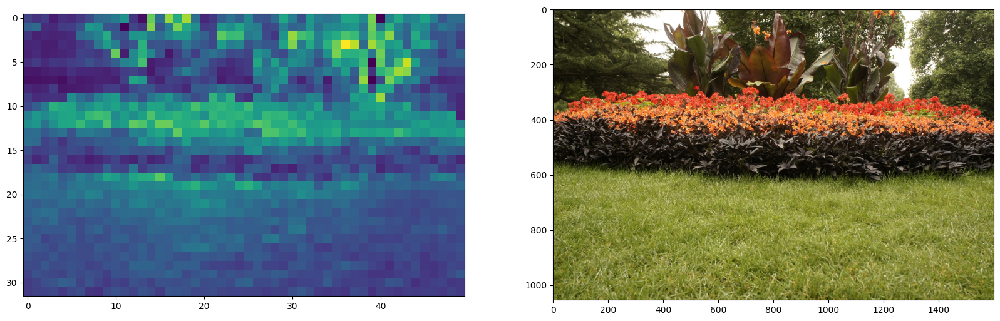

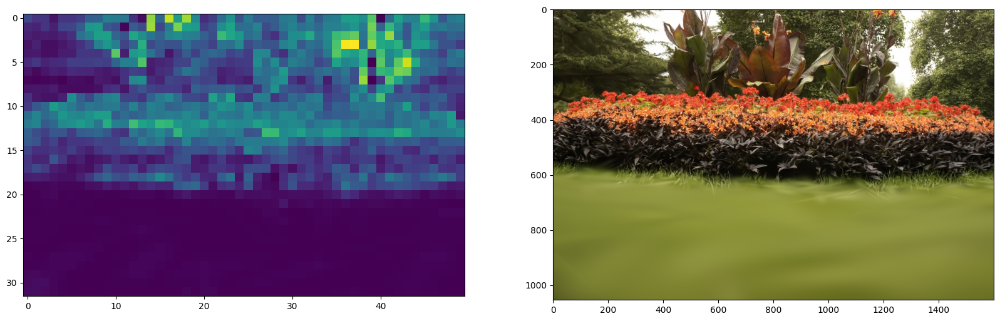

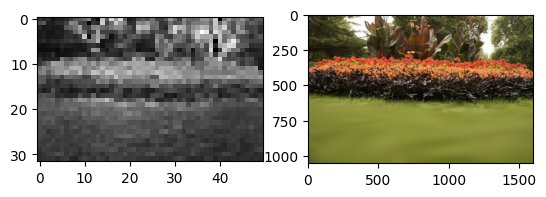

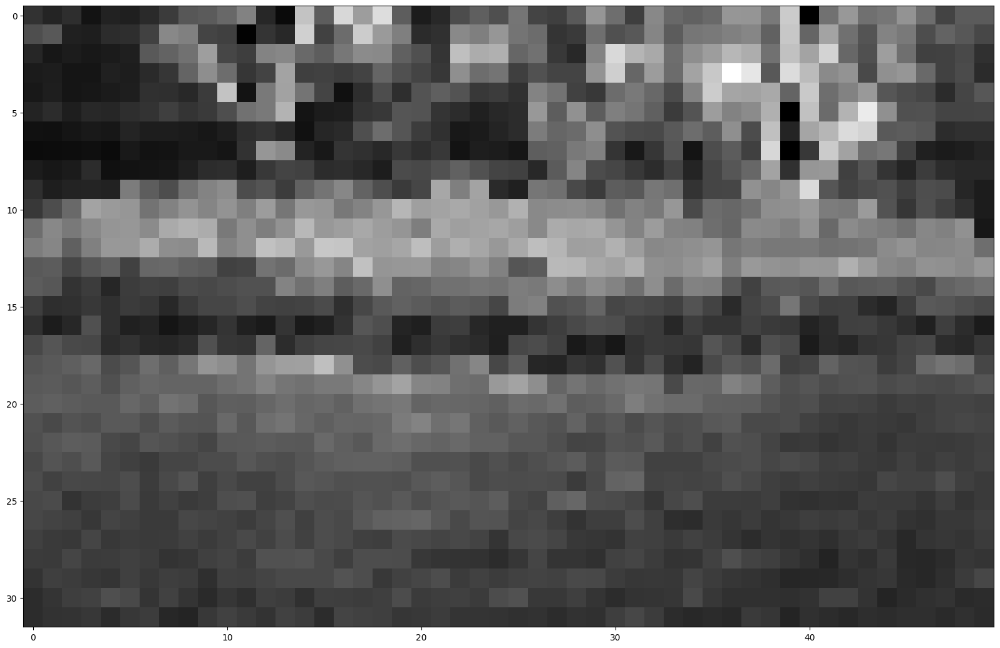

In [ ]:
plt.figure(figsize=(20, 20))
plt.subplot(1,2,1)
plt.imshow(
    np.array(high_freq_score_gt).reshape(
        int(image_gt_np.shape[0]/patch_size[0]), int(image_gt_np.shape[1]/patch_size[1])
    )
)
plt.subplot(1,2,2)
plt.imshow(image_gt_np)

plt.show()

plt.figure(figsize=(20, 20))
fig = plt.subplot(1,2,1)

plt.imshow(
    np.array(high_freq_score_rendered).reshape(
        int(image_rendered_np.shape[0]/patch_size[0]), int(image_rendered_np.shape[1]/patch_size[1])
    )
)
plt.subplot(1,2,2)
plt.imshow(image_rendered_np)
plt.show()


plt.subplot(1,2,1)
plt.imshow(
    np.array(high_freq_score_diff).reshape(
        int(image_rendered_np.shape[0]/patch_size[0]), int(image_rendered_np.shape[1]/patch_size[1])
    ),
    cmap="gray"
)
plt.subplot(1,2,2)
plt.imshow(image_rendered_np)
plt.show()

plt.figure(figsize=(20, 20))
plt.imshow(
    np.abs(
        np.array(high_freq_score_gt).reshape(
            int(image_gt_np.shape[0]/patch_size[0]), int(image_gt_np.shape[1]/patch_size[1])
        ) - np.array(high_freq_score_rendered).reshape(
            int(image_rendered_np.shape[0]/patch_size[0]), int(image_rendered_np.shape[1]/patch_size[1])
        )
    ), cmap = "gray"
)

In [ ]:
### create empty gaussian model and render image

gaussians_empty = GaussianModel(model_args.sh_degree)
gaussians_empty._xyz            = torch.rand((1, 3), device="cuda")
gaussians_empty._scaling        = torch.rand((1, 3), device="cuda")
gaussians_empty._rotation       = torch.rand((1, 4), device="cuda")
gaussians_empty._opacity        = torch.rand((1, 1), device="cuda")
gaussians_empty._features_dc    = torch.rand((1, 3), device="cuda")
gaussians_empty._features_rest  = torch.rand((1, 15), device="cuda") 

render_pkg_empty = render(
    train_camera_list[CAMERA_IDX], gaussians_empty, pipe_args,
    bg_color = torch.rand((3), device="cuda") if optim_args.random_background else background
)
image_empty_rendered_torch = render_pkg_empty["render"].detach().cpu()
#image_rendered_np = (image_rendered_torch.numpy().transpose(1,2,0) * 255).astype(np.uint8)
image_empty_rendered_np = image_empty_rendered_torch.clamp(0, 1).permute(1,2,0).numpy()

plt.imshow(image_empty_rendered_np)
plt.show()
